In [48]:
using Plots
using PlutoUI
using LinearAlgebra
using Random
using Statistics
using StatsBase
using Distributions
using Printf


In [1]:
struct
	Carta
	    valor::Int  # 1 a 10
	    naipe::Symbol  # :ouros, :espadas, :copas, :paus
end

In [2]:
mutable struct Jogador
    nome::String
    estrategia::Char  # 'A' (maior carta), 'B' (menor carta), 'C' (aleatório)
    coeficiente_pede_truco::Float64
    coeficiente_aceita_truco::Float64
    pontuacao::Int
end

In [6]:
function mostrar_carta(c::Carta)
	    nomes_valor = Dict(1=>"A", 2=>"2", 3=>"3", 4=>"4", 5=>"5", 6=>"6", 7=>"7", 10=>"Q", 11=>"J", 12=>"K")
	    nomes_naipe = Dict(:ouros=>"♦️", :espadas=>"♠️", :copas=>"♥️", :paus=>"♣️")
	    return "$(c.valor)$(nomes_naipe[c.naipe])"
end
function criar_baralho()
    valores = [1,2,3,4,5,6,7,10,11,12]  # sem 8,9
    naipes = [:ouros, :espadas, :copas, :paus]
    [Carta(v, n) for v in valores for n in naipes]
end
function embaralhar_baralho(baralho)
    Random.shuffle(baralho)
end
function decide_pedir_truco(jogador::Jogador, forca::Float64, situacao::Bool, qnt_manilha::Int)
    base = jogador.coeficiente_pede_truco

    # Aumenta o coeficiente se estiver ganhando
    if situacao
        base += 0.1
    end

    # Aumenta ainda mais se tiver manilhas
    base += 0.15 * qnt_manilha

    # Aumenta se a força média das cartas for alta (> 6 na escala de 1 a 10)
    if forca > 6
        base += 0.1
    end

    # Garante que não passe de 1.0
    base = min(base, 1.0)

    return rand() < base
end
function distribuir_mao(baralho::Vector{Carta})
    mao1 = baralho[1:3]   # 3 cartas para jogador 1
    mao2 = baralho[4:6]   # 3 cartas para jogador 2
    resto = baralho[7:end]  # restante do baralho, sendo o baralho embaralhado
    
    return mao1, mao2, resto
end
function decide_aceitar_truco(jogador::Jogador, forca::Float64, situacao::Bool, qnt_manilha::Int)
    base = jogador.coeficiente_aceita_truco

    if situacao
        base += 0.1
    end
    base += 0.15 * qnt_manilha

    if forca > 6
        base += 0.1
    end

    base = min(base, 1.0)

    return rand() < base
end
function ordem_truco(c::Carta, manilha_valor::Int)
    manilhas = [Carta(manilha_valor, n) for n in [:ouros, :espadas, :copas, :paus]]
    
    if any(x -> x.valor == c.valor && x.naipe == c.naipe, manilhas)
        idx = findfirst(x -> x.valor == c.valor && x.naipe == c.naipe, manilhas)
        return 100 + idx  # mais forte
    else
        # ordem decrescente: 3,2,A,K,J,Q,7,6,5,4
        ordem = [3,2,1,12,11,10,7,6,5,4]
        idx = findfirst(==(c.valor), ordem)
        return isnothing(idx) ? 0 : idx  # 0 se não encontrar valor
    end
end
function calcular_forca_mao(mao::Vector{Carta}, manilha_valor::Int)
    forças = [ordem_truco(carta, manilha_valor) for carta in mao]
    return mean(forças)
end
function escolher_carta!(mao::Vector{Carta}, manilha_valor::Int, estrategia::Char)
    if isempty(mao)
        return nothing  # ou erro, ou tratamento específico
    end

    if estrategia == 'A'
        forças = [ordem_truco(carta, manilha_valor) for carta in mao]
        idx = argmin(forças)
    elseif estrategia == 'B'
        forças = [ordem_truco(carta, manilha_valor) for carta in mao]
        idx = argmax(forças)
    else
        idx = rand(1:length(mao))  # aleatória
    end

    return splice!(mao, idx)
end
function jogar_rodada(j1::Jogador, j2::Jogador)
    baralho = embaralhar_baralho(criar_baralho())
    mao1, mao2, resto = distribuir_mao(baralho)
    manilha_card = resto[1]
    manilha_valor = (manilha_card.valor % 10) + 1

    pediu_truco = false
    aceitou_truco = false  
    valor_rodada = 1
    pnt1 = 0
    pnt2 = 0

    while pnt1 < 2 && pnt2 < 2 && !isempty(mao1)
        # Calcular força da mão de j1
        forca_j1 = calcular_forca_mao(mao1, manilha_valor)
        manilhas = [Carta(manilha_valor, n) for n in [:ouros, :espadas, :copas, :paus]]
        qnt_manilha_j1 = count(c -> any(m -> m.valor == c.valor && m.naipe == c.naipe, manilhas), mao1)
        situacao_j1 = pnt1 > pnt2

        if !pediu_truco && decide_pedir_truco(j1, forca_j1, situacao_j1, qnt_manilha_j1)
            pediu_truco = true
            valor_rodada = 3

            # Calcular para j2 também
            forca_j2 = calcular_forca_mao(mao2, manilha_valor)
            qnt_manilha_j2 = count(c -> any(m -> m.valor == c.valor && m.naipe == c.naipe, manilhas), mao2)
            situacao_j2 = pnt2 > pnt1

            aceitou_truco = decide_aceitar_truco(j2, forca_j2, situacao_j2, qnt_manilha_j2)

            if !aceitou_truco
                return 1, valor_rodada  # jogador 1 vence por W.O.
            end
        end

        # Jogada: escolher cartas
        carta_j1 = escolher_carta!(mao1, manilha_valor, j1.estrategia)
        carta_j2 = escolher_carta!(mao2, manilha_valor, j2.estrategia)

        # Comparar forças
        força1 = ordem_truco(carta_j1, manilha_valor)
        força2 = ordem_truco(carta_j2, manilha_valor)

        if força1 < força2
            pnt2 += 1 
        elseif força2 < força1
            pnt1 += 1
        else
            # Empate: ponto para ninguém (ou decidir quem jogou primeiro ganha, se quiser)
        end
    end

    if pnt1 > pnt2
        return 1, valor_rodada
    elseif pnt2 > pnt1
        return 2, valor_rodada
    else
        return 0, valor_rodada  # empate raro (3 empates seguidos)
    end
end
function jogar_partida(j1::Jogador, j2::Jogador)
    j1.pontuacao = 0
    j2.pontuacao = 0
    while j1.pontuacao < 12 && j2.pontuacao < 12
        vencedor, valor = jogar_rodada(j1, j2)
        if vencedor == 1
            j1.pontuacao += valor
        else
            j2.pontuacao += valor
        end
    end
    return j1.pontuacao >= 12 ? 1 : 2
end

# ╔═╡ 0942e9cc-3b8a-42d7-bb63-e54ae58e51a3
begin
alice = Jogador("Alice", 'A', 0.6, 0.7, 0)  # Estratégia A = joga carta mais forte
bob = Jogador("Bob", 'C', 0.3, 0.8, 0)     # Estratégia C = joga carta aleatória
end

# ╔═╡ fff96e3b-6bbd-4308-9fe9-868d532cda96
function gerar_jogadores_por_estrategia(letra::Char, n::Int)
    return [
        begin
            pede_coef = rand()
            Jogador("$(letra)_$(i)", letra, pede_coef, 1 - pede_coef, 0)
        end
        for i in 1:n
    ]
end

gerar_jogadores_por_estrategia (generic function with 1 method)

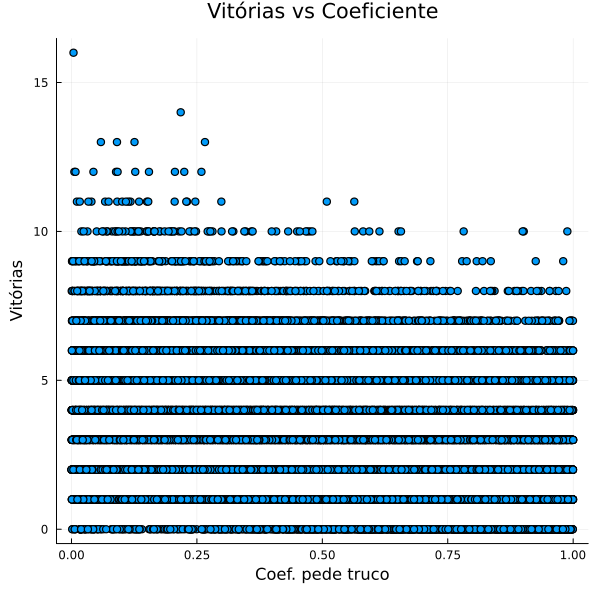

In [ ]:

Random.seed!(1234)

jogadores = vcat(
    gerar_jogadores_por_estrategia('A', 10000),
    gerar_jogadores_por_estrategia('B', 10000),
    gerar_jogadores_por_estrategia('C', 10000),
)

n_partidas = 100_000
resultados = Dict(j.nome => 0 for j in jogadores)

for _ in 1:n_partidas
    indices = rand(1:length(jogadores), 2)
    while indices[1] == indices[2]
        indices = rand(1:length(jogadores), 2)
    end
    j1, j2 = jogadores[indices[1]], jogadores[indices[2]]

    vencedor = jogar_partida(deepcopy(j1), deepcopy(j2))
    if vencedor == 1
        resultados[j1.nome] += 1
    elseif vencedor == 2
        resultados[j2.nome] += 1
    end
end

nomes = collect(keys(resultados))
vitorias = collect(values(resultados))

coef_truco = Dict(j.nome => j.coeficiente_pede_truco for j in jogadores)
x = [coef_truco[n] for n in nomes]
y = vitorias

plot(scatter(x, y, xlabel="Coef. pede truco", ylabel="Vitórias", title="Vitórias vs Coeficiente", legend=false), size=(600, 600))


In [8]:
print(resultados)

Dict("A_6612" => 3, "B_9495" => 3, "A_816" => 3, "C_3435" => 2, "B_8486" => 7, "B_1173" => 2, "A_3808" => 7, "A_3083" => 4, "A_6719" => 2, "C_6807" => 5, "B_9277" => 6, "A_4089" => 3, "A_8880" => 1, "C_8480" => 3, "C_4738" => 4, "B_3327" => 1, "C_2512" => 2, "B_9135" => 2, "A_7266" => 5, "A_9298" => 1, "A_6687" => 4, "A_8674" => 0, "C_2450" => 4, "A_7932" => 4, "A_8639" => 3, "B_801" => 2, "A_4065" => 1, "B_6884" => 3, "B_9085" => 0, "B_8013" => 2, "B_2978" => 4, "B_3080" => 0, "B_9423" => 3, "B_1183" => 7, "B_3899" => 5, "B_5518" => 2, "A_1511" => 4, "C_7681" => 6, "B_2241" => 4, "A_3031" => 2, "B_5805" => 4, "C_6095" => 2, "C_8317" => 6, "B_3626" => 7, "A_8286" => 2, "A_8608" => 5, "B_8307" => 1, "C_8448" => 4, "C_6445" => 2, "A_5144" => 0, "A_4337" => 3, "C_1593" => 1, "B_9559" => 2, "C_2814" => 2, "C_829" => 5, "C_7243" => 4, "B_6558" => 3, "B_4545" => 0, "B_9740" => 1, "A_378" => 2, "A_7940" => 7, "C_4277" => 4, "C_7585" => 3, "C_1056" => 2, "A_610" => 3, "A_5709" => 3, "C_3081" =

In [36]:
b_range = 0:1:20  # Faixas de 0.05 entre 0 e 1

0:1:20

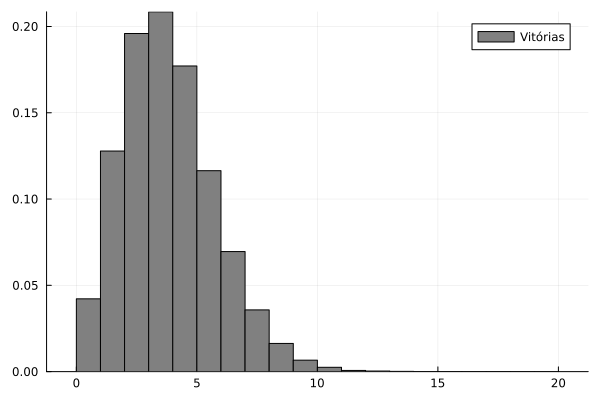

TypeError: TypeError: in typeassert, expected REPL.REPLCompletions.MethodCompletion, got a value of type REPL.REPLCompletions.TextCompletion

In [37]:
histogram(y, bins=b_range, normalize=:pdf, label="Vitórias", color=:gray)



In [38]:
mean(y)

3.3333333333333335

TypeError: TypeError: in typeassert, expected REPL.REPLCompletions.MethodCompletion, got a value of type REPL.REPLCompletions.TextCompletion

In [39]:
mean(x)

0.5005594766922394

TypeError: TypeError: in typeassert, expected REPL.REPLCompletions.MethodCompletion, got a value of type REPL.REPLCompletions.TextCompletion

3

In [42]:
agrupado = Dict{String, Int}()

for (k, v) in resultados
    estrategia = split(k, "_")[1]  # Get "A" from "A_6612"
    agrupado[estrategia] = get(agrupado, estrategia, 0) + v
end

println(agrupado)


Dict("B" => 32698, "A" => 33896, "C" => 33406)


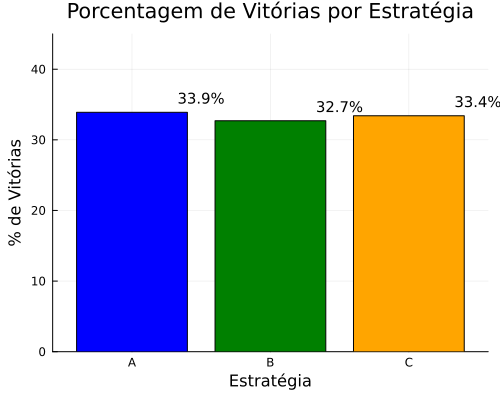

In [54]:
estrategias = ["A", "B", "C"]

# Obter vitórias correspondentes, mantendo ordem
vitorias = [agrupado[e] for e in estrategias]

# Calcular total e porcentagem
total_vitorias = sum(vitorias)
percentuais = 100 .* vitorias ./ total_vitorias

# Definir cores distintas por coluna
cores = [:blue, :green, :orange]

# Plotar
p = bar(estrategias, percentuais,
    xlabel = "Estratégia",
    ylabel = "% de Vitórias",
    title = "Porcentagem de Vitórias por Estratégia",
    legend = false,
    color = cores,
    size = (500, 400),
    ylims = (0, 45))
for (i, p_val) in enumerate(percentuais)
    texto = @sprintf("%.1f%%", p_val)
    annotate!(p, i, p_val + 2, Plots.text(texto, :black, 10, halign = :center))
end
p